In [1]:
import os
# import sys
# module_path = os.path.abspath(os.path.join('../../'))
# if module_path not in sys.path:
#     sys.path.append(module_path)
%matplotlib widget

In [2]:
import time
import torch
# from torch_geometric.loader import DataLoader
import argparse
import yaml
# from torch_geometric.nn import radius
from torch.optim import Adam
import torch.autograd.profiler as profiler
from torch.profiler import profile, record_function, ProfilerActivity

# from rbfConv import RbfConv
# from dataset import compressedFluidDataset, prepareData

import inspect
import re
def debugPrint(x):
    frame = inspect.currentframe().f_back
    s = inspect.getframeinfo(frame).code_context[0]
    r = re.search(r"\((.*)\)", s).group(1)
    print("{} [{}] = {}".format(r,type(x).__name__, x))
# %matplotlib notebook
import copy

import time
import torch
# from torch_geometric.loader import DataLoader
from tqdm.notebook import trange, tqdm
import argparse
import yaml
# from torch_geometric.nn import radius
from torch.optim import Adam
import torch.autograd.profiler as profiler
from torch.profiler import profile, record_function, ProfilerActivity

# from BasisConvolution.convLayer import RbfConv
# from dataset import compressedFluidDataset, prepareData

import inspect
import re
def debugPrint(x):
    frame = inspect.currentframe().f_back
    s = inspect.getframeinfo(frame).code_context[0]
    r = re.search(r"\((.*)\)", s).group(1)
    print("{} [{}] = {}".format(r,type(x).__name__, x))


import tomli
from scipy.optimize import minimize
import matplotlib.patches as patches
from mpl_toolkits.axes_grid1 import make_axes_locatable
from matplotlib.colors import LogNorm
from matplotlib.ticker import MaxNLocator
import matplotlib.ticker as mticker
import matplotlib.pyplot as plt

seed = 0


import random 
import numpy as np
random.seed(seed)
torch.manual_seed(seed)
torch.cuda.manual_seed(seed)
np.random.seed(seed)
# print(torch.cuda.device_count())
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
# print('running on: ', device)
torch.set_num_threads(1)

from joblib import Parallel, delayed

# from cutlass import *
# from rbfConv import *
from tqdm.autonotebook import tqdm
import random 
import numpy as np
from BasisConvolution.test_case_II.datautils import splitFile
from BasisConvolution.test_case_II.datautils import datasetLoader, loadFrame
from BasisConvolution.detail.windows import getWindowFunction
from BasisConvolution.test_case_II.util import constructFluidFeatures
from BasisConvolution.convNetv2 import BasisNetwork
from datetime import datetime
import portalocker
from BasisConvolution.detail.augment import augment
from BasisConvolution.test_case_II.training import processBatch
# from datautils import *
# from sphUtils import *
# from lossFunctions import *

import warnings
warnings.filterwarnings("ignore", category=DeprecationWarning)

from BasisConvolution.test_case_II.util import setSeeds, loadDataset, getDataLoader, getFeatureSizes
from BasisConvolution.detail.util import count_parameters
import json
from BasisConvolution.test_case_II.util import NumpyArrayEncoder
import seaborn as sns
import matplotlib as mpl
import pandas as pd
from BasisConvolution.test_case_II.training import loadFrame, runNetwork
from BasisConvolution.detail.scatter import scatter_sum
from BasisConvolution.test_case_II.eval import getUnrollFrame

cm = mpl.colormaps['viridis']
import os

/tmp/ipykernel_248954/2365636771.py:74: TqdmExperimentalWarning: Using `tqdm.autonotebook.tqdm` in notebook mode. Use `tqdm.tqdm` instead to force console mode (e.g. in jupyter console)
  from tqdm.autonotebook import tqdm


In [3]:
# basePath = '~/servus05/dev/datasets/generative2D/train'
basePath = '../../datasets/test_case_II/test'
basePath = '~/dev/diffSPH/generative/export'
basePath = os.path.expanduser(basePath)

simulationFiles = [basePath + '/' + f for f in os.listdir(basePath) if f.endswith('.hdf5')]
debugPrint(simulationFiles)

simulationFiles [list] = ['/home/winchenbach/dev/diffSPH/generative/export/2024_03_13-13_19_49.hdf5']


In [4]:
# trainFolder = os.path.expanduser('../../trainingData/test_case_II/')
# subfolders = [ f.path for f in os.scandir(trainFolder) if (f.is_dir() and 'None' not in f.path)]
# subfolders = [ f.path for f in os.scandir(trainFolder) if (f.is_dir())]
# # subfolders = [ f.path for f in os.scandir('./trainingDataBasisFunctions8x8') if f.is_dir() ]
# print(len(subfolders))

# subfolders = [s for s in subfolders if os.path.exists(s + '/results.json')]
# print(len(subfolders))

# dataDict = {}

# # subfolders = [subfolders[0]]
# for s in tqdm(subfolders):
#     with open("%s/results.json" % s, "r") as read_file:
#         decodedArray = json.load(read_file)
#         dataDict[s] = decodedArray
# #         print(decodedArray['hyperParameters'])   

In [5]:
# trainingLosses = {}
# # validationLosses = {}
# for s in subfolders:
#     trainingEpochLosses = [np.asarray(dataDict[s]['epochData'][k]['training']) for k in dataDict[s]['epochData'].keys()]
# #     validationEpochLosses = [np.asarray(dataDict[s]['epochData'][k]['validation']) for k in dataDict[s]['epochData'].keys()]
#     trainingLosses[s] = trainingEpochLosses
# #     validationLosses[s] = validationEpochLosses
# # debugPrint(trainingLosses)

# for s in tqdm(subfolders):
#     if 'training' in dataDict[s]['dataSet']:
#         del dataDict[s]['dataSet']['training']

In [6]:

# losses = {}
# for s in subfolders:
#     trainingEpochLosses = trainingLosses[s]
#     overallLosses = np.vstack([np.expand_dims(np.vstack((np.mean(e[:,:,0], axis = 1), np.max(e[:,:,1], axis = 1), np.min(e[:,:,2], axis = 1) , np.mean(e[:,:,3], axis = 1))),2).T for e in trainingEpochLosses])
#     losses[s] = overallLosses


In [7]:
from matplotlib.lines import Line2D
# cols = plt.rcParams['axes.prop_cycle'].by_key()['color']
# legend_elements = [Line2D([0], [0], color=cols[xvars.index(x) % len(cols)], lw=4, label='%s = %s' % (which_x, x)) for x in xvars]

In [8]:


# which_y = 'timestamp'
# which_z = 'networkSeed'
# which_x = 'timestamp'
# means = [np.mean(losses[s][-1,:,0]) for s in subfolders]
# idx = np.argsort(means)

# xvars = []
# yvars = []
# zvars = []
# for ss in idx:
#     s = subfolders[ss]
#     xv = dataDict[s]['hyperParameters'][which_x]
#     yv = dataDict[s]['hyperParameters'][which_y]
#     zv = dataDict[s]['hyperParameters'][which_z]
#     yv = dataDict[s]['hyperParameters']['rbf_x'] + ' x ' + dataDict[s]['hyperParameters']['rbf_y'] + ' @ ' + str(dataDict[s]['hyperParameters']['n'])
#     if xv not in xvars:
#         xvars.append(xv)
#     if yv not in yvars:
#         yvars.append(yv)
#     if zv not in zvars:
#         zvars.append(zv)
# debugPrint(xvars)
# debugPrint(yvars)
# debugPrint(zvars)
# # xvars.sort()
# # yvars.sort()
# zvars.sort()

In [9]:
# import numpy as np
# import matplotlib.pyplot as plt
# import matplotlib.colors as colors
# import matplotlib.cbook as cbook
# from matplotlib import cm


# # which_y = 'arch'
# # which_x = 'n'
# # which_z = 'frameDistance'

# # xvars = []
# # yvars = []
# # zvars = []
# # for s in subfolders:
# #     xv = dataDict[s]['hyperParameters'][which_x]
# #     if xv not in xvars:
# #         xvars.append(xv)
# #     yv = dataDict[s]['hyperParameters'][which_y]
# #     if yv not in yvars:
# #         yvars.append(yv)
# #     zv = dataDict[s]['hyperParameters'][which_z]
# #     if zv not in zvars:
# #         zvars.append(zv)
# # debugPrint(xvars)
# # debugPrint(yvars)
# # debugPrint(zvars)
# # xvars.sort()
# # yvars.sort()
# # zvars.sort()

# import matplotlib.patheffects as path_effects
# txtLabels = []
# def plotToAxis(axis, mat, bounds = None, label = None):
#     if label is not None:
#         axis.set_title(label)
#     if bounds is None:
#         im = axis.imshow(mat, vmin=mat[np.logical_not(np.isnan(mat))].min(), vmax=mat[np.logical_not(np.isnan(mat))].max(), aspect='auto')
#     else:
#         im = axis.imshow(mat, norm=colors.LogNorm(vmin=bounds[0], vmax=bounds[1]), aspect='auto')
# #         im = axis.imshow(mat, vmin=bounds[0], vmax=bounds[1])
#     for (j,i),label in np.ndenumerate(mat):
#         if not np.isnan(label):
#             st = '%1.2e' % label
#             txtLabels.append(axis.text(i,j,st,ha='center',va='center', color = 'white', fontsize=8, rotation = 0))       
#             txtLabels[-1].set_path_effects([path_effects.Stroke(linewidth=2, foreground='black'), path_effects.Normal()])

#     axis.set_yticks(np.arange(len(xvars)))
#     axis.set_yticklabels(xvars, minor = False, rotation =0, fontsize = 12)
#     axis.set_ylabel('%s' % which_x, fontsize = 12)
#     axis.set_xlabel('%s' % which_y, fontsize = 12)
#     axis.set_xticks(np.arange(len(yvars)))
#     axis.set_xticklabels(yvars, minor = False, rotation =90, fontsize = 12)
    
#     return im

# def plot_funcMeta(epoch, shareCmap = True):
#     global txtLabels
#     for lbl in txtLabels:
#         lbl.remove()
        
#     fig.suptitle('Meta Loss, Epoch %d' % (epoch))
#     for i in range(len(zvars)):
#         for j, a in enumerate(axs[i][0,:]):
#             a.cla()
# #             a.set_title('%s = %s' %(which_y, yvars[j]))
# #         axs[i][0,0].set_title('Mean Loss')
# #         axs[i][0,1].set_title('Max Loss')
# #         axs[i][0,2.set_title('Stddev Loss')
#     meanDict = {}
#     maxDict = {}
#     stdDict = {}
#     for i in range(len(zvars)):
#         meanDict[zvars[i]] = np.zeros((len(xvars), len(yvars))) * np.nan
#         maxDict[zvars[i]] = np.zeros((len(xvars), len(yvars))) * np.nan
#         stdDict[zvars[i]] = np.zeros((len(xvars), len(yvars))) * np.nan
    
#     for s in subfolders:
#         xs = dataDict[s]['hyperParameters'][which_x]        
#         ys = dataDict[s]['hyperParameters'][which_y]
#         zs = dataDict[s]['hyperParameters'][which_z]
# #         xs = dataDict[s]['hyperParameters']['rbf_x'] + ' x ' + dataDict[s]['hyperParameters']['rbf_y']
#         ys = dataDict[s]['hyperParameters']['rbf_x'] + ' x ' + dataDict[s]['hyperParameters']['rbf_y'] + ' @ ' + str(dataDict[s]['hyperParameters']['n'])
# #         print('xs:', xs, 'ys:', ys, 'zs:', zs)
#         meanDict[zs][xvars.index(xs), yvars.index(ys)] = np.mean(losses[s][epoch,:,0])
#         maxDict[zs][xvars.index(xs), yvars.index(ys)] = np.max(losses[s][epoch,:,1])
#         stdDict[zs][xvars.index(xs), yvars.index(ys)] = np.mean(losses[s][epoch,:,3])
    
#     minMaxMean = np.array([1e10,-1e10])
#     minMaxMax = np.array([1e10,-1e10])
#     minMaxStd = np.array([1e10,-1e10])
#     for i in range(len(zvars)):
#         minMaxMean[0] = min(minMaxMean[0], np.min(meanDict[zvars[i]][np.logical_not(np.isnan(meanDict[zvars[i]]))]))
#         minMaxMean[1] = max(minMaxMean[1], np.min(meanDict[zvars[i]][np.logical_not(np.isnan(meanDict[zvars[i]]))]))
#         minMaxMax[0] = min(minMaxMax[0], np.min(maxDict[zvars[i]][np.logical_not(np.isnan(maxDict[zvars[i]]))]))
#         minMaxMax[1] = max(minMaxMax[1], np.min(maxDict[zvars[i]][np.logical_not(np.isnan(maxDict[zvars[i]]))]))
#         minMaxStd[0] = min(minMaxStd[0], np.min(stdDict[zvars[i]][np.logical_not(np.isnan(stdDict[zvars[i]]))]))
#         minMaxStd[1] = max(minMaxStd[1], np.min(stdDict[zvars[i]][np.logical_not(np.isnan(stdDict[zvars[i]]))]))
# #         minMaxMax  = (min(minMaxMax[0], np.min(maxDict[zvars[i]][np.logical_not(np.isnan(meanDict[zvars[i]]))])), max(minMaxMax[1], np.min(maxDict[zvars[i]][np.logical_not(np.isnan(meanDict[zvars[i]]))])))
# #         minMaxStd  = (min(minMaxStd[0], np.min(stdDict[zvars[i]][np.logical_not(np.isnan(meanDict[zvars[i]]))])),max(minMaxStd[1], np.min(stdDict[zvars[i]][np.logical_not(np.isnan(meanDict[zvars[i]]))]))
        
# #     print(minMaxMean)
# #     print(minMaxMax)
# #     print(minMaxStd)
#     if shareCmap:
#         for i in range(len(zvars)):
#             means = meanDict[zvars[i]]
#     #         print(means, means.shape)
#             plotToAxis(axs[i][0,0], meanDict[zvars[i]], label = 'Mean Loss', bounds = minMaxMean)
#             plotToAxis(axs[i][0,1], maxDict[zvars[i]], label = 'Max Loss', bounds = minMaxMax)
#             plotToAxis(axs[i][0,2], stdDict[zvars[i]], label = 'Std Loss', bounds = minMaxStd)
#     else:        
#         for i in range(len(zvars)):
#             means = meanDict[zvars[i]]
#     #         print(means, means.shape)
#             plotToAxis(axs[i][0,0], meanDict[zvars[i]], label = 'Mean Loss')
#             plotToAxis(axs[i][0,1], maxDict[zvars[i]], label = 'Max Loss')
#             plotToAxis(axs[i][0,2], stdDict[zvars[i]], label = 'Std Loss')
#     fig.canvas.draw_idle()
    
# # fig = plt.figure(layout='constrained', figsize=(4 * 4, 4 * len(zvars)))
# fig = plt.figure(layout='constrained', figsize=(16, 12 * len(zvars)))
# fig.suptitle('Mean Loss, Epoch %d' % -1)
# subfigs = fig.subfigures(len(zvars), 1, wspace=0.07, squeeze = False)

# epoch = -1

# axs = []
# for i in range(len(zvars)):
#     subfigs[i,0].suptitle('%s = %s' % (which_z, zvars[i]), fontsize='x-large')
#     lax = subfigs[i,0].subplots(1, 3, sharey=True, squeeze = False)
#     axs.append(lax)    
    
# plot_funcMeta(-1, shareCmap = False)
    
    

In [10]:
# meanDict = {}
# maxDict = {}
# stdDict = {}
# for i in range(len(zvars)):
#     meanDict[zvars[i]] = np.zeros((len(xvars), len(yvars))) * np.nan
#     maxDict[zvars[i]] = np.zeros((len(xvars), len(yvars))) * np.nan
#     stdDict[zvars[i]] = np.zeros((len(xvars), len(yvars))) * np.nan

# for s in subfolders:
#     xs = dataDict[s]['hyperParameters'][which_x]        
#     ys = dataDict[s]['hyperParameters'][which_y]
#     zs = dataDict[s]['hyperParameters'][which_z]
# #         xs = dataDict[s]['hyperParameters']['rbf_x'] + ' x ' + dataDict[s]['hyperParameters']['rbf_y']
#     ys = dataDict[s]['hyperParameters']['rbf_x'] + ' x ' + dataDict[s]['hyperParameters']['rbf_y'] + ' @ ' + str(dataDict[s]['hyperParameters']['n'])
# #         print('xs:', xs, 'ys:', ys, 'zs:', zs)
#     meanDict[zs][xvars.index(xs), yvars.index(ys)] = np.mean(losses[s][epoch,:,0])
#     maxDict[zs][xvars.index(xs), yvars.index(ys)] = np.max(losses[s][epoch,:,1])
#     stdDict[zs][xvars.index(xs), yvars.index(ys)] = np.mean(losses[s][epoch,:,3])

# minMaxMean = np.array([1e10,-1e10])
# minMaxMax = np.array([1e10,-1e10])
# minMaxStd = np.array([1e10,-1e10])
# for i in range(len(zvars)):
#     minMaxMean[0] = min(minMaxMean[0], np.min(meanDict[zvars[i]][np.logical_not(np.isnan(meanDict[zvars[i]]))]))
#     minMaxMean[1] = max(minMaxMean[1], np.min(meanDict[zvars[i]][np.logical_not(np.isnan(meanDict[zvars[i]]))]))
#     minMaxMax[0] = min(minMaxMax[0], np.min(maxDict[zvars[i]][np.logical_not(np.isnan(maxDict[zvars[i]]))]))
#     minMaxMax[1] = max(minMaxMax[1], np.min(maxDict[zvars[i]][np.logical_not(np.isnan(maxDict[zvars[i]]))]))
#     minMaxStd[0] = min(minMaxStd[0], np.min(stdDict[zvars[i]][np.logical_not(np.isnan(stdDict[zvars[i]]))]))
#     minMaxStd[1] = max(minMaxStd[1], np.min(stdDict[zvars[i]][np.logical_not(np.isnan(stdDict[zvars[i]]))]))

    
# fig, axis = plt.subplots(1, 3, figsize=(16,8*1.09), sharex = False, sharey = False, squeeze = False)
# means = meanDict[zvars[0]].transpose()
# maxs = maxDict[zvars[0]].transpose()
# stds = stdDict[zvars[0]].transpose()

# for i in range(len(means)):
#     xs = yvars[i]
#     sortIdx = np.argsort(means[i])[::-1]
#     axis[0,0].semilogy(means[i][sortIdx], label = xs)
#     axis[0,1].semilogy(maxs[i][sortIdx], label = xs)
#     axis[0,2].semilogy(stds[i][sortIdx], label = xs)
# axis[0,2].legend()
# axis[0,0].set_title('Mean Loss')
# axis[0,1].set_title('Max Loss')
# axis[0,2].set_title('Std. Dev Loss')
# fig.tight_layout()

In [11]:
# del trainingLosses
# del losses

interactive(children=(Dropdown(description='file', options=('/home/winchenbach/dev/diffSPH/generative/export/2…

<function __main__.plotNetwork(file, frame)>

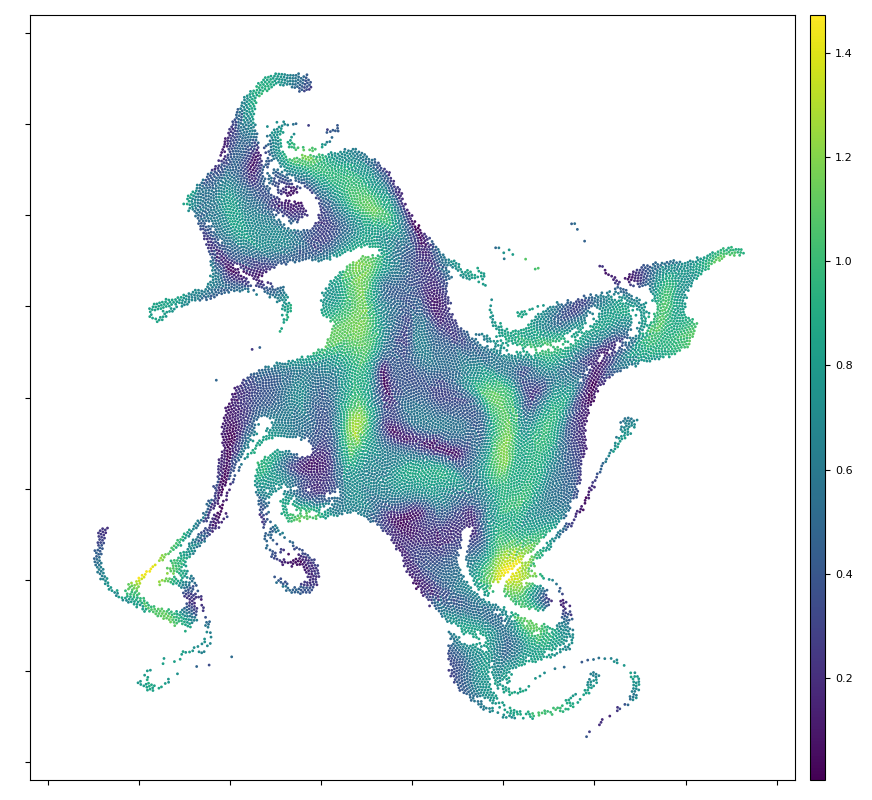

In [19]:

fig, axis = plt.subplots(1, 1, figsize=(8*1.09,8), sharex = False, sharey = False, squeeze = False)

attributes, inputData, groundTruthData = loadFrame(simulationFiles[0], 0, 1 + np.arange(1), 1)


x = inputData['fluidPosition'][:,0].detach().cpu().numpy()
y = inputData['fluidPosition'][:,1].detach().cpu().numpy()

# v = (gt[:,-1:] - modelOutput) ** 2
v = torch.linalg.norm(inputData['fluidVelocity'],dim=1)

# axis[0,0].set_title('Velocity')
# sc = axis[1,0].scatter(x,y,c = v,s=0.25)
GTsc = axis[0,0].scatter(x,y,c = v.detach().cpu().numpy(), s= 1)
axis[0,0].axis('equal')
axis[0,0].set_xlim(-2.1,2.1)
axis[0,0].set_ylim(-2.1,2.1)
# axis[0,1].axvline(-2)
# axis[0,1].axvline(2)
# axis[0,1].axhline(-2)
# axis[0,1].axhline(2)
if inputData['boundaryPosition'] is not None:
    axis[0,0].scatter(inputData['boundaryPosition'][:,0], inputData['boundaryPosition'][:,1], c = 'red', s =16 )
axis[0,0].set_xticklabels([])
axis[0,0].set_yticklabels([])
ax1_divider = make_axes_locatable(axis[0,0])
cax1 = ax1_divider.append_axes("right", size="2%", pad="2%")
GTcbar = fig.colorbar(GTsc, cax=cax1,orientation='vertical')
GTcbar.ax.tick_params(labelsize=8) 
fig.tight_layout()


def plotNetwork(file, frame):
    attributes, inputData, groundTruthData = loadFrame(file, frame, 1 + np.arange(1), 1)

    data = inputData['fluidDensity'].detach().cpu().numpy()
    positions = inputData['fluidPosition'].detach().cpu().numpy()
    
    data = torch.linalg.norm(inputData['fluidVelocity'],dim=1).detach().cpu().numpy()
#     debugPrint(data.shape)
    positions = inputData['fluidPosition'].detach().cpu().numpy()
    GTsc.set_offsets(positions)
    GTsc.set_array(data)
    GTcbar.mappable.set_clim(vmin=np.min(data), vmax=np.max(data))

#     axis[0,0].set_title('%s @ %2d' % (file.split('/')[-1], frame))
    fig.canvas.draw()
    fig.canvas.flush_events()



# plotNetwork(simulationFiles[0], 0, subfolders[0], epochs - 1)
from ipywidgets import interact, interactive, fixed, interact_manual
import ipywidgets as widgets

interact(plotNetwork, file = simulationFiles, frame = widgets.IntSlider(value=1023, min=0, max=2000 -1, step=1))



In [13]:
from BasisConvolution.test_case_II.eval import *

simulationFiles [list] = ['../../datasets/test_case_II/train/generative - 2023-03-22_14-41-01.hdf5', '../../datasets/test_case_II/train/generative - 2023-03-22_15-10-00.hdf5', '../../datasets/test_case_II/train/generative - 2023-03-22_15-30-36.hdf5', '../../datasets/test_case_II/train/generative - 2023-03-22_14-30-52.hdf5', '../../datasets/test_case_II/train/generative - 2023-03-22_15-24-38.hdf5', '../../datasets/test_case_II/train/generative - 2023-03-22_14-33-24.hdf5', '../../datasets/test_case_II/train/generative - 2023-03-22_14-59-06.hdf5', '../../datasets/test_case_II/train/generative - 2023-03-22_14-43-33.hdf5', '../../datasets/test_case_II/train/generative - 2023-03-22_14-35-55.hdf5', '../../datasets/test_case_II/train/generative - 2023-03-22_15-15-52.hdf5', '../../datasets/test_case_II/train/generative - 2023-03-22_14-56-29.hdf5', '../../datasets/test_case_II/train/generative - 2023-03-22_15-04-27.hdf5', '../../datasets/test_case_II/train/generative - 2023-03-22_15-45-38.hdf5',

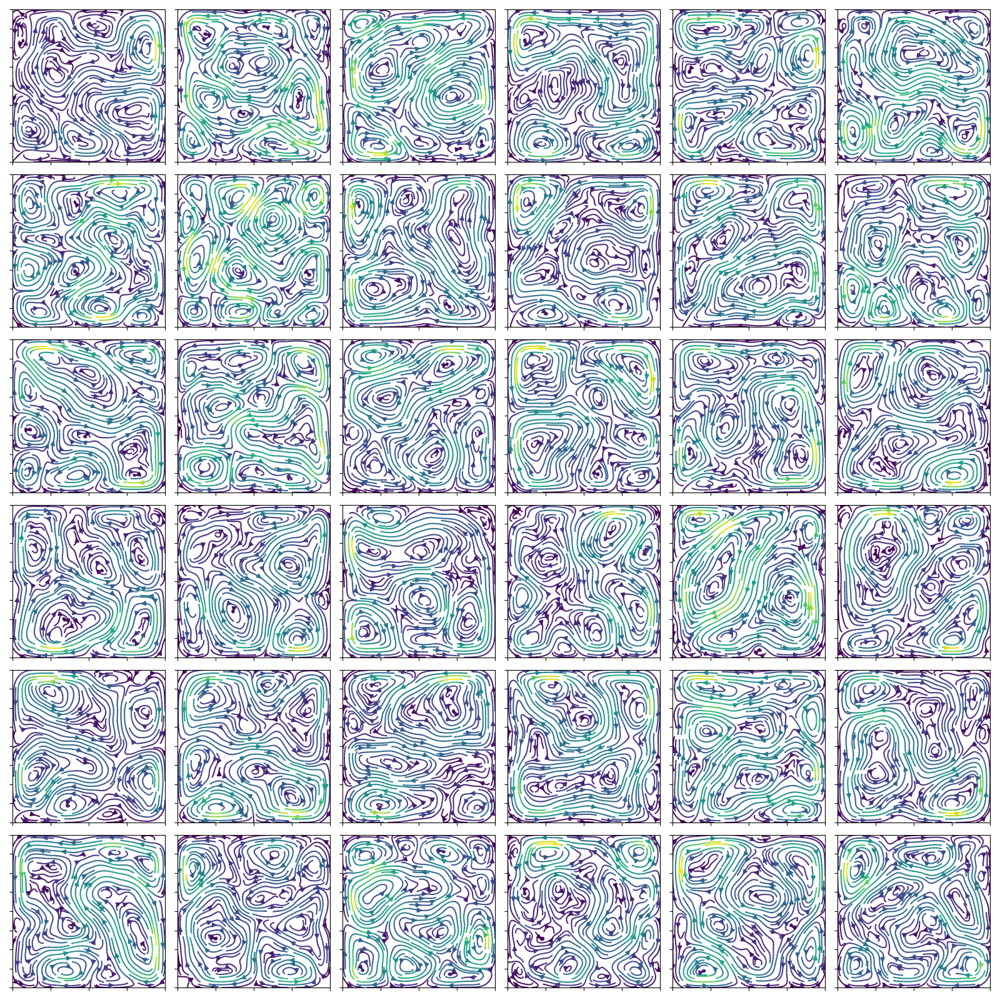

In [14]:
basePath = '../../datasets/test_case_II/train'
basePath = os.path.expanduser(basePath)

simulationFiles = [basePath + '/' + f for f in os.listdir(basePath) if f.endswith('.hdf5')]
debugPrint(simulationFiles)

frame = 0
attributes, inputData, groundTruthData = loadFrame(simulationFiles[0], frame, 1 + np.arange(1), 1)

nx = 128
fp, meshDensity, meshVelocity, meshDivergence = getMeshQuantities(inputData['fluidPosition'], inputData['boundaryPosition'], inputData['fluidArea'], inputData['boundaryArea'], inputData['fluidDensity'], inputData['fluidVelocity'], attributes, n = nx)


    
fig, axis = plt.subplots(6, 6, figsize=(16,16), sharex = False, sharey = False, squeeze = False)

def pMesh(fig, axis, xx,yy,data,title):
    sc = axis.pcolormesh(xx,yy,data)
    axis.axis('equal')

    ax1_divider = make_axes_locatable(axis)
    cax1 = ax1_divider.append_axes("right", size="4%", pad="1%")
    cbar = fig.colorbar(sc, cax=cax1,orientation='vertical')
    cbar.ax.tick_params(labelsize=8) 
    axis.set_title(title)
    return sc

x = np.linspace(-1,1,nx)
y = np.linspace(-1,1,nx)
xx, yy = np.meshgrid(x,y)
pos = torch.tensor(np.stack((xx,yy), axis = 2).reshape(nx * nx, 2), device = device, dtype = inputData['fluidPosition'].dtype)
#     print(pos.shape)
#i, j, distances, radialDistances = radius(pos, inputData['fluidPosition'], attributes['support'])

for i in range(6):
    for j in range(6):
        file = simulationFiles[i + 6 * j]
        attributes, inputData, groundTruthData = loadFrame(file, frame, 1 + np.arange(1), 1)
        fp, meshDensity, meshVelocity, meshDivergence = getMeshQuantities(inputData['fluidPosition'], inputData['boundaryPosition'], inputData['fluidArea'], inputData['boundaryArea'], inputData['fluidDensity'], inputData['fluidVelocity'], attributes, n = nx)
        vel = meshVelocity #scatter(sphSimulation.simulationState['fluidVelocity'][i] * (sphSimulation.simulationState['fluidArea'][i] / sphSimulation.simulationState['fluidDensity'][i] * kernel(radialDistances, sphSimulation.config['particle']['support']))[:,None], j, dim = 0, dim_size = nx**2, reduce = 'sum')().cpu().numpy()
        xVel = vel.reshape(nx,nx,2)[:,:,0].detach().cpu().numpy()
        yVel = vel.reshape(nx,nx,2)[:,:,1].detach().cpu().numpy()
        axis[i,j].streamplot(xx,yy,xVel, yVel,color = np.linalg.norm(vel.reshape(nx,nx,2).detach().cpu().numpy(), axis = 2), density = 1.5)
        axis[i,j].set_xlim(-1,1)
        axis[i,j].set_ylim(-1,1)
        axis[i,j].set_aspect(1)
        axis[i,j].set_xticklabels([])
        axis[i,j].set_yticklabels([])
#         break
#     break

fig.tight_layout()

simulationFiles [list] = ['../../datasets/test_case_II/test/generative - 2023-03-13_10-01-01.hdf5', '../../datasets/test_case_II/test/generative - 2023-03-13_10-31-28.hdf5', '../../datasets/test_case_II/test/generative - 2023-03-13_10-16-02.hdf5', '../../datasets/test_case_II/test/generative - 2023-03-13_10-34-07.hdf5', '../../datasets/test_case_II/test/generative - 2023-03-13_10-36-42.hdf5', '../../datasets/test_case_II/test/generative - 2023-03-13_10-03-31.hdf5', '../../datasets/test_case_II/test/generative - 2023-03-13_10-39-18.hdf5', '../../datasets/test_case_II/test/generative - 2023-03-13_10-26-18.hdf5', '../../datasets/test_case_II/test/generative - 2023-03-13_10-18-34.hdf5', '../../datasets/test_case_II/test/generative - 2023-03-13_10-21-09.hdf5', '../../datasets/test_case_II/test/generative - 2023-03-13_10-28-47.hdf5', '../../datasets/test_case_II/test/generative - 2023-03-13_10-08-20.hdf5', '../../datasets/test_case_II/test/generative - 2023-03-13_10-05-55.hdf5', '../../datas

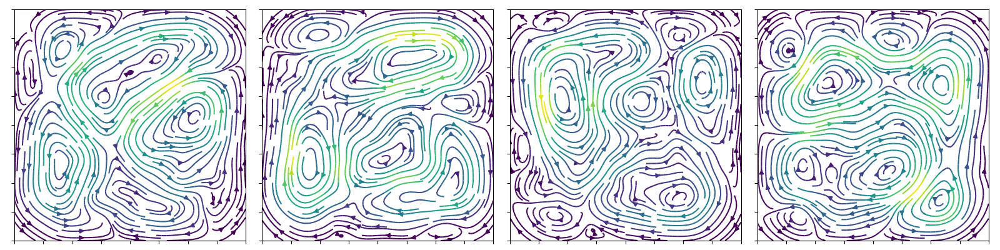

In [15]:
basePath = '../../datasets/test_case_II/test'
basePath = os.path.expanduser(basePath)

simulationFiles = [basePath + '/' + f for f in os.listdir(basePath) if f.endswith('.hdf5')]
debugPrint(simulationFiles)


frame = 0
attributes, inputData, groundTruthData = loadFrame(file, frame, 1 + np.arange(1), 1)

nx = 128
fp, meshDensity, meshVelocity, meshDivergence = getMeshQuantities(inputData['fluidPosition'], inputData['boundaryPosition'], inputData['fluidArea'], inputData['boundaryArea'], inputData['fluidDensity'], inputData['fluidVelocity'], attributes, n = nx)


    
fig, axis = plt.subplots(1, 4, figsize=(16,4), sharex = False, sharey = False, squeeze = False)

def pMesh(fig, axis, xx,yy,data,title):
    sc = axis.pcolormesh(xx,yy,data)
    axis.axis('equal')

    ax1_divider = make_axes_locatable(axis)
    cax1 = ax1_divider.append_axes("right", size="4%", pad="1%")
    cbar = fig.colorbar(sc, cax=cax1,orientation='vertical')
    cbar.ax.tick_params(labelsize=8) 
    axis.set_title(title)
    return sc

x = np.linspace(-1,1,nx)
y = np.linspace(-1,1,nx)
xx, yy = np.meshgrid(x,y)
pos = torch.tensor(np.stack((xx,yy), axis = 2).reshape(nx * nx, 2), device = device, dtype = inputData['fluidPosition'].dtype)
#     print(pos.shape)
#i, j, distances, radialDistances = radius(pos, inputData['fluidPosition'], attributes['support'])

for i in range(4):
    for j in range(1):
        file = simulationFiles[i + 4 * j]
        attributes, inputData, groundTruthData = loadFrame(file, frame, 1 + np.arange(1), 1)
        fp, meshDensity, meshVelocity, meshDivergence = getMeshQuantities(inputData['fluidPosition'], inputData['boundaryPosition'], inputData['fluidArea'], inputData['boundaryArea'], inputData['fluidDensity'], inputData['fluidVelocity'], attributes, n = nx)
        vel = meshVelocity #scatter(sphSimulation.simulationState['fluidVelocity'][i] * (sphSimulation.simulationState['fluidArea'][i] / sphSimulation.simulationState['fluidDensity'][i] * kernel(radialDistances, sphSimulation.config['particle']['support']))[:,None], j, dim = 0, dim_size = nx**2, reduce = 'sum')().cpu().numpy()
        xVel = vel.reshape(nx,nx,2)[:,:,0].detach().cpu().numpy()
        yVel = vel.reshape(nx,nx,2)[:,:,1].detach().cpu().numpy()
        axis[j,i].streamplot(xx,yy,xVel, yVel,color = np.linalg.norm(vel.reshape(nx,nx,2).detach().cpu().numpy(), axis = 2), density = 1.5)
        axis[j,i].set_xlim(-1,1)
        axis[j,i].set_ylim(-1,1)
        axis[j,i].set_aspect(1)
        axis[j,i].set_xticklabels([])
        axis[j,i].set_yticklabels([])
#         break
#     break

fig.tight_layout()